# Lab 5 - Neural Networks

In this lab we will use a pre-trained neural network that is designed for image classification. We will show you a number of different visualization options and allow you to play around with them yourself to gain a greater understanding.
Likewise, we will show you how LIME is used for images as well.

You are then tasked to use the techniques on another model to try and explain how it is working, and to investigate if there is any wrong doings in its predictions. Remember to also look into the dataset!

## Setup

### Package Installation
tf-keras-vis was not included in the installation part of lab 1, it needs to be installed here.

**Remember to restart the session! Otherwise you will end up with erroneous imports later on.**

In [ ]:
!pip install -U tensorflow==2.15.1 lime==0.2.0.1 tf-keras-vis==0.8.6 numpy==1.26.4 pandas==2.0.3

### Package import

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as c_map
import matplotlib
from IPython.display import Image, display
import tensorflow as tf
from tensorflow import keras
import os
import PIL
#import os
#os.environ["TF_USE_LEGACY_KERAS"] = "1"

from tensorflow.keras.applications.vgg16 import VGG16 as Model
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.vgg16 import preprocess_input


from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency

### Intializations and loading data

The easiest approach to using the data for the lab, is to download the data folder (lab5_data) from the lab assignment page on blackboard. Reupload them to your root folder on your google drive. The cell below mounts your google drive to reach those uploaded files later. If you choose to do something else, you are free to do so but remember to update the file paths.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
GDRIVE = 'drive/MyDrive/ExplainableAIHH/Lab5'
FOLDER = 'lab5_data'

basepath = os.path.join(GDRIVE, FOLDER)

!ls $basepath

bear.jpg  goldfish.jpg	husky_wolves  triceratops.jpg


## Neural Network Image Activation visualizations

You will use the VGG16 model. If you are not familiar with the model, you can read more about it - [here](https://keras.io/api/applications/vgg/) and [here](https://arxiv.org/pdf/1409.1556). The framework that we will use is [Keras](https://keras.io/getting_started/).

553467096/553467096 [==============================] - 2s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

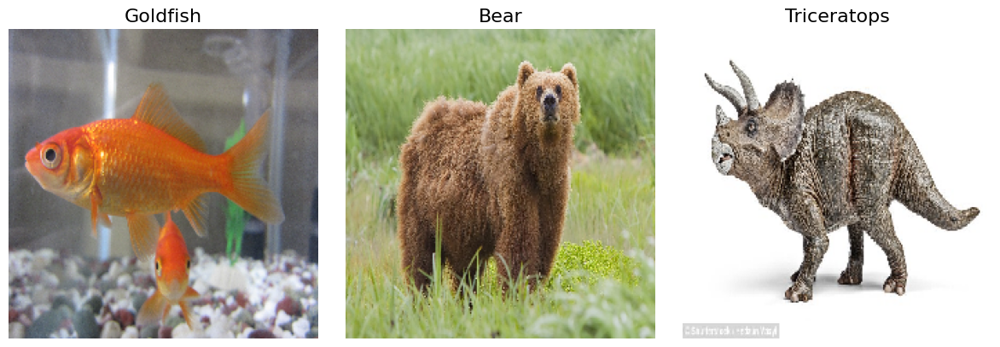

In [ ]:
model = Model(weights='imagenet', include_top=True)
model.summary()

# Image titles
image_titles = ['Goldfish', 'Bear', 'Triceratops']
# Load images and Convert them to a Numpy array
img1 = load_img(os.path.join(basepath, 'goldfish.jpg'), target_size=(224, 224))
img2 = load_img(os.path.join(basepath, 'bear.jpg'), target_size=(224, 224))
img3 = load_img(os.path.join(basepath, 'triceratops.jpg'), target_size=(224, 224))
#img1 = load_img('goldfish.JPG', target_size=(224, 224))
#img2 = load_img('bear.jpg', target_size=(224, 224))
#img3 = load_img('triceratops.jpg', target_size=(224, 224))
images = np.asarray([np.array(img1), np.array(img2), np.array(img3)])

# Preparing input data for VGG16
X = preprocess_input(images)

# Rendering
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

Boilerplate code for the tf-Keras-vis package.

In [ ]:
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

def score_function(output):
    # This version returns the result for the corresponding class from the
    # prediction of each image we are to show.
    # output[x][y] -> x = which image, y = which class in the imagenet labels
    return (output[0][1], output[1][294], output[2][51])

# Alters the softmax output to a linear output
replace2linear = ReplaceToLinear()

# The actual labels to each category that we investigate, i.e. the goldfish,
# bear, and triceratops label indices.
score = CategoricalScore([1, 294, 51])

Saliency map

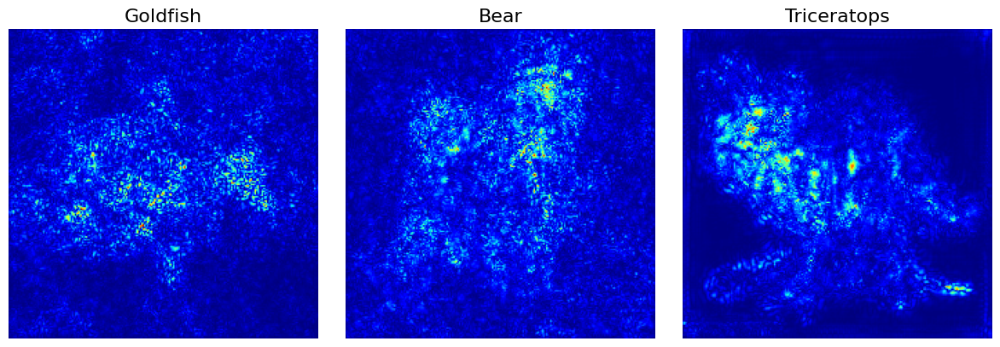

In [ ]:
from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency

# Create Saliency object.
saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

# Generate saliency map
saliency_map = saliency(score, X)

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(saliency_map[i], cmap='jet')
    ax[i].axis('off')
plt.tight_layout()
plt.show()

Smooth Saliency map.

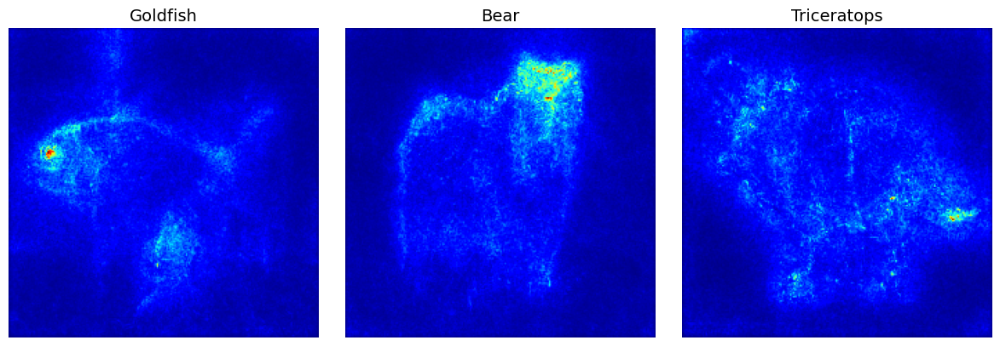

In [ ]:
# Generate saliency map with smoothing that reduce noise by adding noise
saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

saliency_map = saliency(score,
                        X,
                        smooth_samples=20, # The number of calculating gradients iterations.
                        smooth_noise=0.20) # noise spread level.

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=14)
    ax[i].imshow(saliency_map[i], cmap='jet')
    ax[i].axis('off')
plt.tight_layout()
plt.show()

GRAD-Cam

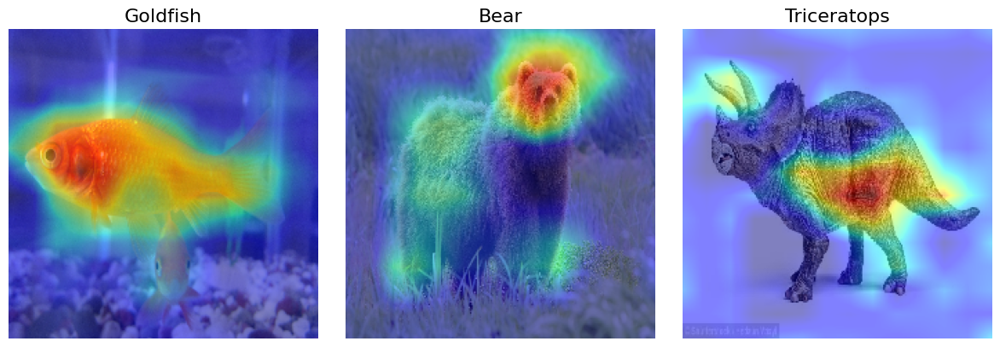

In [ ]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

# Create Gradcam object
gradcam = Gradcam(model,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
cam = gradcam(score,
              X,
              penultimate_layer=-1)

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

GRAD-CAM++

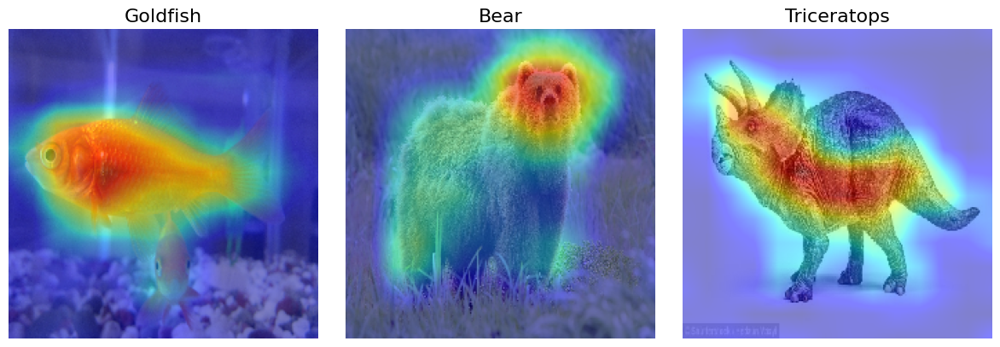

In [ ]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(model,
                          model_modifier=replace2linear,
                          clone=True)

# Generate heatmap with GradCAM++
cam = gradcam(score,
              X,
              penultimate_layer=-1)

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
    ax[i].axis('off')
plt.tight_layout()
plt.show()

(Faster) ScoreCAM

3/3 [==============================] - 1s 385ms/step


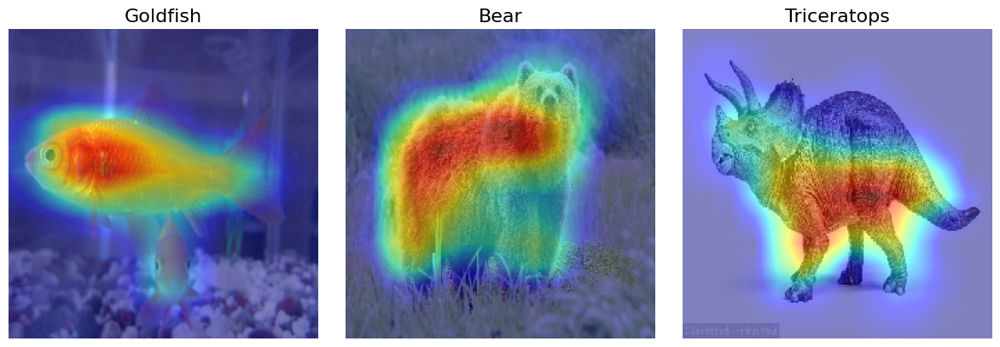

In [ ]:
# Fast ScoreCAM
from tf_keras_vis.scorecam import Scorecam

# Create ScoreCAM object
scorecam = Scorecam(model, model_modifier=replace2linear)

# Generate heatmap with Faster-ScoreCAM
cam = scorecam(score,
               X,
               penultimate_layer=-1,
               max_N=10)

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
    ax[i].axis('off')
plt.tight_layout()
plt.show()

These visualization techniques try to highlight which pixels provide the most importance to the prediction of the image.

What's you view of the techniques? Are they useful?

I think they are useful, especially it can help identify if the model is focusing on something that we dont want it to focus on (e.g. the model bases it's prediction on features that shouldn't be relevant).

## Neural Network Layer Dissections/visualizations
We change the scoring from before to work in this context. The following score, when used, returns the value from the 3rd filter in the **block5_conv3** layer.

In [ ]:
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer, ReplaceToLinear

layer_name = 'block5_conv3' # The target layer that is the last layer of VGG16.

# This instance constructs new model whose output is replaced to `block5_conv3` layer's output.
extract_intermediate_layer = ExtractIntermediateLayer(index_or_name=layer_name)
# This instance modify the model's last activation function to linear one.
replace2linear = ReplaceToLinear()

filter_number = 3
score = CategoricalScore(filter_number)

Create an activation maximum instance

In [ ]:
from tf_keras_vis.activation_maximization import ActivationMaximization

activation_maximization = ActivationMaximization(model,
                                                 # Please note that `extract_intermediate_layer` has to come before `replace2linear`.
                                                 model_modifier=[extract_intermediate_layer, replace2linear],
                                                 clone=False)

Visualizes the 63rd convolutional layer. This takes a while to run, so if you're in a hurry you can skip it for now.

In [ ]:
from tf_keras_vis.activation_maximization.callbacks import Progress

# Generate maximized activation
activations = activation_maximization(score,
                                      callbacks=[Progress()])

200/200 [==============================] - 31s 153ms/step - Score: 371.7673 - TotalVariation2D: 10.3022 - Norm: 38.4495


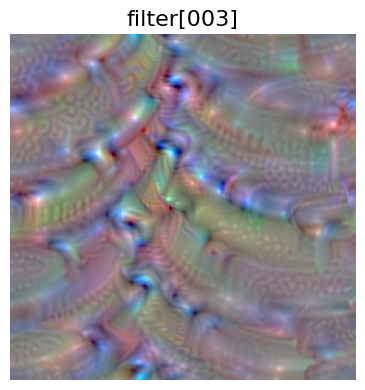

In [ ]:
# Render the filter from above
f, ax = plt.subplots(figsize=(4, 4))
ax.imshow(tf.cast(activations[0], np.uint8))
ax.set_title('filter[{:03d}]'.format(filter_number), fontsize=16)
ax.axis('off')
plt.tight_layout()
plt.show()

These techniques instead tries to visualize the features each layer is seeing from an image. How would you describe the above? Is it useful for you to understand this filter? Can you understand it?

It is somewhat useful, but still unclear what it is. Looks like this filter is likely to be be highly activated for images of snakes. The pattern on the "coils" looks like snake skin and in the lower left corner it looks like eyes. Also, from my experience, snakes often have in this kind of "coiled" body position.

## LIME
The LIME library also works well on images, to see where the model puts its interest in the images it predicts upon.


In [ ]:
import lime
from lime import lime_image

# creating the explainer object
explainer = lime_image.LimeImageExplainer()

# You can view each individual image we have looked at before by
# changing the index in the images[] variable below.
explanation = explainer.explain_instance(images[2], model.predict
                                         , top_labels=5,
                                         hide_color=0, num_samples=5000)



  0%|          | 0/5000 [00:00<?, ?it/s]

It is important that you run a large amount of samples, otherwise you could get misleading results. Try and lower the num_samples substantially above and see what happens.

You can visualize with both the image as the background

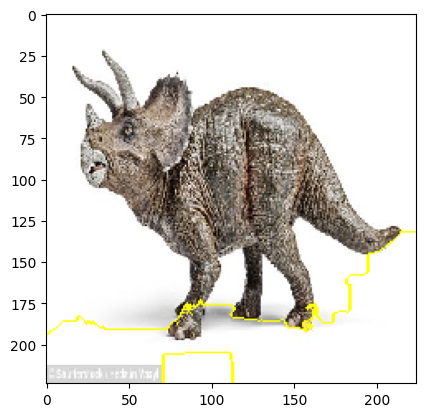

In [ ]:
from skimage.segmentation import mark_boundaries
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))

Or just the mask itself.

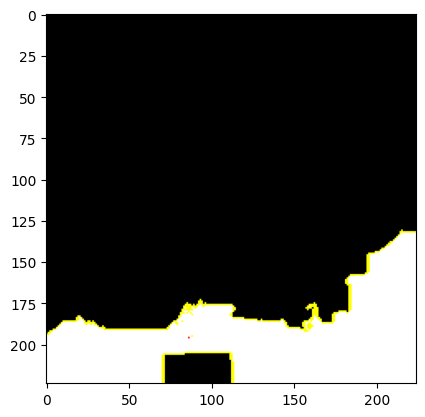

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
plt.imshow(mark_boundaries(temp, mask))

# Assignment
In your assignment, you are to use the given blackbox model on a dataset and explore if you can identify what the model has actually learned. The dataset is based on the Dogs and Wolves dataset from [Kaggle](https://www.kaggle.com/datasets/harishvutukuri/dogs-vs-wolves?resource=download). It has been significantly reduced and picked out images to only contain huskies and wolves. Some additional images have been added manually.

Investigate the model using **some** of the techniques shown from **tf-keras-vis** and using the **LIME** library and try to explain what the model have actually learned. Using tf-keras-vis and its visualizations might require you to improve your tensorflow/keras skills, here is their website for guidande and examples if needed [website](https://keisen.github.io/tf-keras-vis-docs/index.html)

Look into which images are correctly classified in the validation set and which aren't. Visualize which parts of the images that are of importance for the model.

What conclusions can you draw?

What does the model really look for in the images?

Show your steps, explain them, and reflect upon your results in cells below.

You will find an example of how you can use and visualize the Saliency Maps on this dataset and model. Adapt accordingly for the remainder of the techniques.


# Assignment

## Black box training
Training the model to be analyzed by the students.

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPool2D, Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import sys
import matplotlib.pyplot as plt
import numpy as np

training_path = os.path.join(basepath, 'husky_wolves/training/')
validation_path = os.path.join(basepath, 'husky_wolves/validation/')

image_gen = ImageDataGenerator(rescale=1./255)
train_generator = image_gen.flow_from_directory(directory=training_path,
                                                target_size=(256,256),
                                                batch_size=20,
                                                shuffle=True,
                                                seed=101)

Found 76 images belonging to 2 classes.


In [ ]:
def get_model(input_shape):
    """
    This function should build and compile a CNN model according to the above specification,
    using the functional API. Your function should return the model.
    """
    input_layer = Input(input_shape)
    h = Conv2D(name="CONV_LAYER_1", filters=8, kernel_size=(8,8), padding='SAME', activation='relu')(input_layer)
    h = MaxPool2D((2,2))(h)
    h = Conv2D(4, (4,4), name="CONV_LAYER_2", padding='SAME', activation='relu')(h)
    h = MaxPool2D((2,2))(h)
    Flatten_layer = Flatten()(h)
    h = Dense(16, activation='relu')(Flatten_layer)
    output_layer = Dense(2, activation='softmax')(h)
    model = Model(inputs= input_layer, outputs = output_layer)
    opt = tf.keras.optimizers.Adam(learning_rate=0.0005)
    model.compile(optimizer=opt, loss = 'categorical_crossentropy', metrics = [tf.keras.metrics.CategoricalAccuracy(name='accuracy')])
    return model

model = get_model((256, 256, 3))
model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 CONV_LAYER_1 (Conv2D)       (None, 256, 256, 8)       1544      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 128, 128, 8)       0         
 g2D)                                                            
                                                                 
 CONV_LAYER_2 (Conv2D)       (None, 128, 128, 4)       516       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 64, 64, 4)         0         
 g2D)                                                            
                                                                 
 flatten_1 (Flatten)         (None, 16384)             0   

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the EarlyStopping callback
# Monitor validation accuracy ('val_accuracy') and stop training if it doesn't improve for 5 epochs (patience=5)
# Restore the best weights found during training
early_stopping = EarlyStopping(monitor='accuracy', patience=5, restore_best_weights=True)

# Fit the model with the early stopping callback
model.fit(train_generator, epochs=35, callbacks=[early_stopping])

Epoch 1/35
4/4 [==============================] - 1s 75ms/step - loss: 0.7053 - accuracy: 0.4474
Epoch 2/35
4/4 [==============================] - 0s 91ms/step - loss: 0.6695 - accuracy: 0.7895
Epoch 3/35
4/4 [==============================] - 0s 89ms/step - loss: 0.6740 - accuracy: 0.6053
Epoch 4/35
4/4 [==============================] - 0s 62ms/step - loss: 0.6148 - accuracy: 0.9211
Epoch 5/35
4/4 [==============================] - 0s 77ms/step - loss: 0.5751 - accuracy: 0.7368
Epoch 6/35
4/4 [==============================] - 0s 84ms/step - loss: 0.4893 - accuracy: 0.8158
Epoch 7/35
4/4 [==============================] - 0s 89ms/step - loss: 0.4163 - accuracy: 0.9342
Epoch 8/35
4/4 [==============================] - 0s 69ms/step - loss: 0.3503 - accuracy: 0.9079
Epoch 9/35
4/4 [==============================] - 0s 83ms/step - loss: 0.2815 - accuracy: 0.9474
Epoch 10/35
4/4 [==============================] - 0s 60ms/step - loss: 0.2403 - accuracy: 0.9342
Epoch 11/35
4/4 [============

## Loading validation data, for you to use.

In [ ]:
images = np.asarray([load_img(os.path.join(validation_path, 'husky', 'husky_validation_{0}.jpg'.format(x)), target_size=(256,256)) for x in range(1,9)] + [load_img(os.path.join(validation_path, 'wolf', 'wolf_validation_{0}.jpg'.format(x)), target_size=(256,256)) for x in range(1,9)])
labels = np.array([0 for x in range(8)] + [1 for x in range(8)])
class_names = ['husky', 'wolf']
images = images/255


In [ ]:
count = 0
i = 0
predictions = model.predict(images)
for i in range(len(labels)):
  if np.argmax(predictions[i]) == labels[i]:
    count += 1
print('validation accuracy %.3f'%(count/len(labels)))

validation accuracy 0.688


## Visualizing validation data

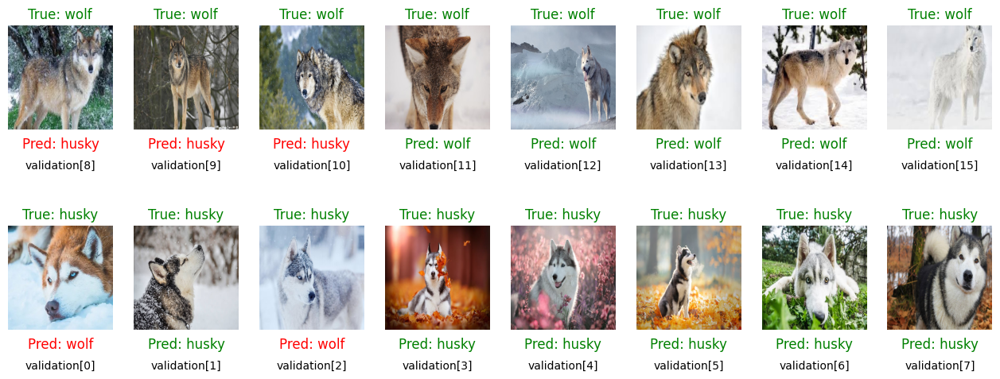

In [ ]:
j = 1
k = 10
plt.figure(figsize=(18,6))
for i in range(16):
  if labels[i] == 0:
    ax = plt.subplot(2,9,k)
    k += 1
  else:
    ax = plt.subplot(2,9,j)
    j+=1

  plt.imshow((images[i]*255).astype('uint8'))




  # Display true and predicted labels
  true_label = class_names[labels[i]]
  predicted_label = class_names[np.argmax(predictions[i])]

  plt.title(f"True: {true_label}", color='green')
  plt.text(128,300, f"Pred: {predicted_label}", color='red' if true_label != predicted_label else 'green', fontsize='large', horizontalalignment='center')
  plt.text(128,350, 'validation[{0}]'.format(i), horizontalalignment='center')




  plt.axis('off')


## Visualizing saliency maps

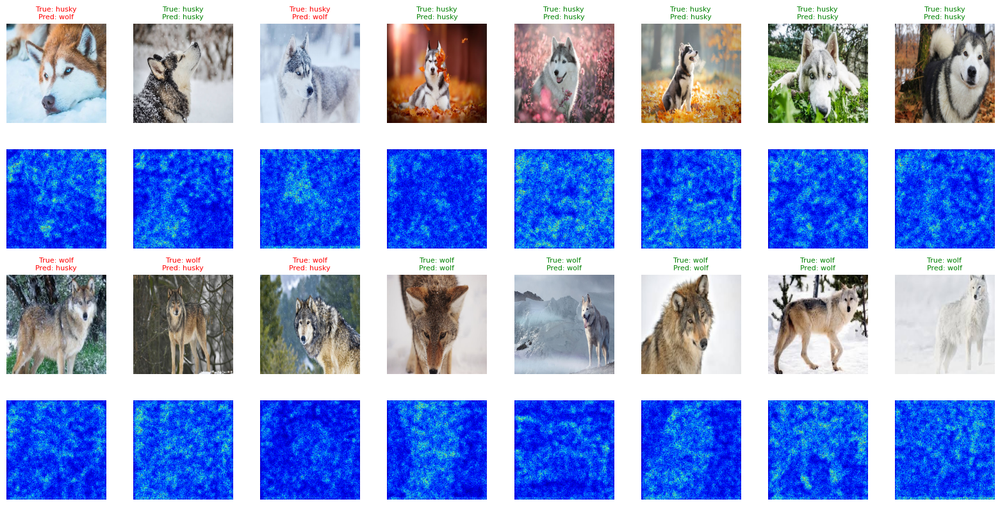

In [ ]:
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
replace2linear = ReplaceToLinear()

# Generate saliency map with smoothing that reduce noise by adding noise

score = CategoricalScore([0]*8+[1]*8)

saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

saliency_map = saliency(score,
                        images)#,
                        #smooth_samples=20, # The number of calculating gradients iterations.
                        #smooth_noise=0.20) # noise spread level.

# Render
# Adjusting layout to show original image above saliency map
plt.figure(figsize=(16, 8)) # Adjusted figure size for 4 rows x 8 columns

# Get predictions to display predicted labels
predictions = model.predict(images)

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Plot Huskies (Original in row 1, Saliency Map in row 2)
for i, img_index in enumerate(husky_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 1)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Saliency Map
    ax2 = plt.subplot(4, 8, i + 9) # Row 2, column i+1 (8 columns in a row)
    ax2.imshow(saliency_map[img_index], cmap='jet') # Display saliency map
    ax2.axis('off')

# Plot Wolves (Original in row 3, Saliency Map in row 4)
for i, img_index in enumerate(wolf_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 17) # Row 3, column i+1 (8 columns in a row)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Saliency Map
    ax2 = plt.subplot(4, 8, i + 25) # Row 4, column i+1 (8 columns in a row)
    ax2.imshow(saliency_map[img_index], cmap='jet') # Display saliency map
    ax2.axis('off')


plt.tight_layout()
plt.show()

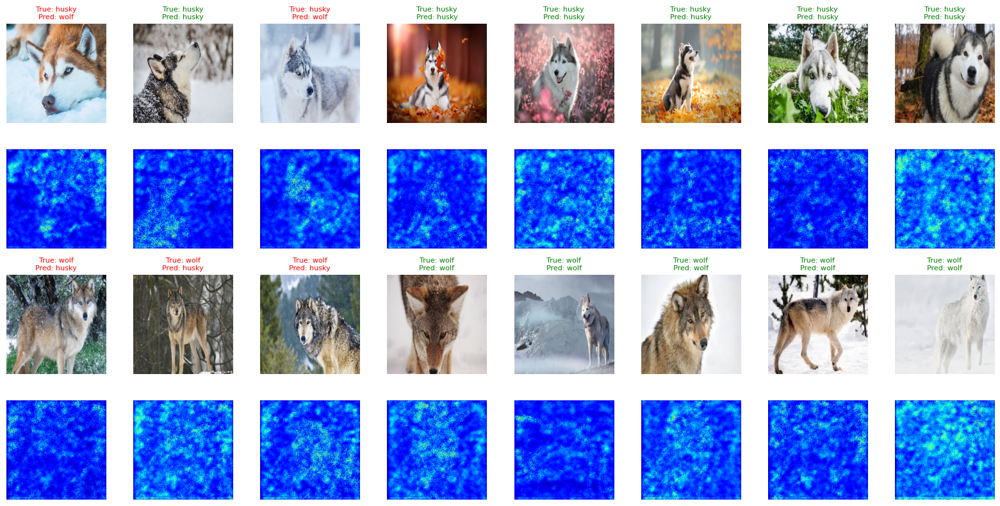

In [ ]:
# Generate saliency map with smoothing that reduce noise by adding noise
saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

# Generate saliency map with smoothing using a smooth_noise value appropriate for normalized images
saliency_map = saliency(score,
                        images, # Use the normalized images here
                        smooth_samples=20, # The number of calculating gradients iterations.
                        smooth_noise=0.05) # Use a small float for noise standard deviation on [0, 1] scale

# Render
# Adjusting layout to show original image above saliency map
plt.figure(figsize=(16, 8)) # Adjusted figure size for 4 rows x 8 columns

# Get predictions to display predicted labels
predictions = model.predict(images)

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Plot Huskies (Original in row 1, Saliency Map in row 2)
for i, img_index in enumerate(husky_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 1)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Saliency Map
    ax2 = plt.subplot(4, 8, i + 9) # Row 2, column i+1 (8 columns in a row)
    ax2.imshow(saliency_map[img_index], cmap='jet') # Display saliency map
    ax2.axis('off')

# Plot Wolves (Original in row 3, Saliency Map in row 4)
for i, img_index in enumerate(wolf_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 17) # Row 3, column i+1 (8 columns in a row)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Saliency Map
    ax2 = plt.subplot(4, 8, i + 25) # Row 4, column i+1 (8 columns in a row)
    ax2.imshow(saliency_map[img_index], cmap='jet') # Display saliency map
    ax2.axis('off')


plt.tight_layout()
plt.show()

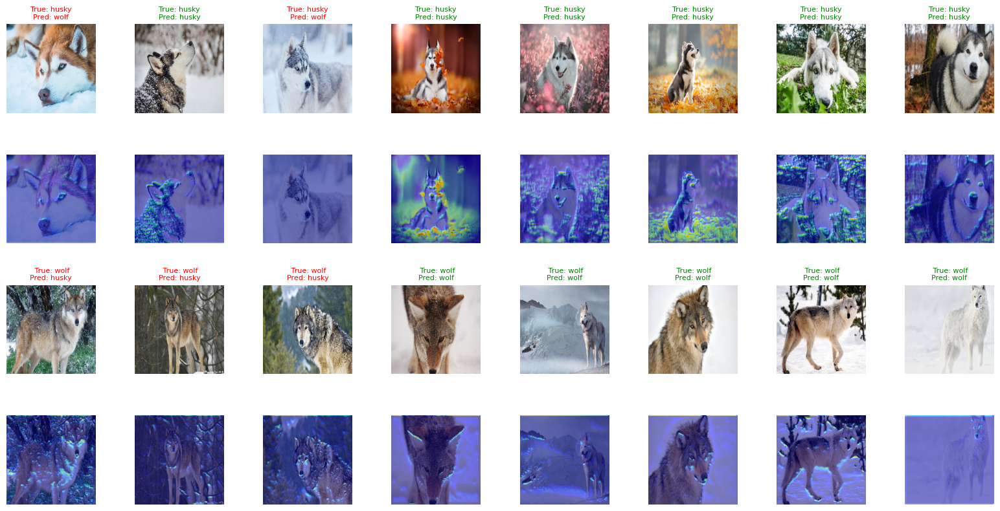

In [ ]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

# Create Gradcam object
gradcam = Gradcam(model,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
# Use the 'score' defined for the husky and wolf images.
cam = gradcam(score,
              images, # Use the normalized husky and wolf images
              penultimate_layer=-1)

# Render the GradCAM heatmaps for the husky and wolf validation images
# Adjusting layout to show original image above heatmap
plt.figure(figsize=(16, 8)) # Adjusted figure size for 4 rows x 8 columns

# Get predictions to display predicted labels
predictions = model.predict(images)

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Plot Huskies (Original in row 1, Heatmap in row 2)
for i, img_index in enumerate(husky_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 1)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Heatmap
    ax2 = plt.subplot(4, 8, i + 9) # Row 2, column i+1 (8 columns in a row)
    heatmap = np.uint8(cm.jet(cam[img_index])[..., :3] * 255)
    ax2.imshow((images[img_index]*255).astype('uint8')) # Display original image under heatmap
    ax2.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax2.axis('off')

# Plot Wolves (Original in row 3, Heatmap in row 4)
for i, img_index in enumerate(wolf_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 17) # Row 3, column i+1 (8 columns in a row)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"\n\n True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Heatmap
    ax2 = plt.subplot(4, 8, i + 25) # Row 4, column i+1 (8 columns in a row)
    heatmap = np.uint8(cm.jet(cam[img_index])[..., :3] * 255)
    ax2.imshow((images[img_index]*255).astype('uint8')) # Display original image under heatmap
    ax2.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax2.axis('off')

plt.tight_layout()
plt.show()

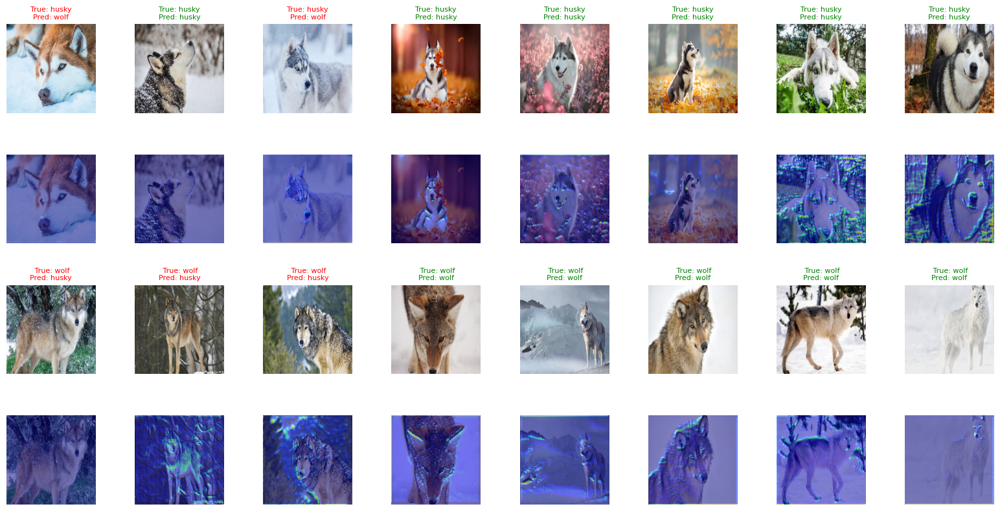

In [ ]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(model,
                          model_modifier=replace2linear,
                          clone=True)

# Generate heatmap with GradCAM++
cam = gradcam(score,
              images,
              penultimate_layer=-1)

# Render the GradCAM heatmaps for the husky and wolf validation images
# Adjusting layout to show original image above heatmap
plt.figure(figsize=(16, 8)) # Adjusted figure size for 4 rows x 8 columns

# Get predictions to display predicted labels
predictions = model.predict(images)

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Plot Huskies (Original in row 1, Heatmap in row 2)
for i, img_index in enumerate(husky_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 1)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Heatmap
    ax2 = plt.subplot(4, 8, i + 9) # Row 2, column i+1 (8 columns in a row)
    heatmap = np.uint8(cm.jet(cam[img_index])[..., :3] * 255)
    ax2.imshow((images[img_index]*255).astype('uint8')) # Display original image under heatmap
    ax2.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax2.axis('off')

# Plot Wolves (Original in row 3, Heatmap in row 4)
for i, img_index in enumerate(wolf_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 17) # Row 3, column i+1 (8 columns in a row)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"\n\n True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Heatmap
    ax2 = plt.subplot(4, 8, i + 25) # Row 4, column i+1 (8 columns in a row)
    heatmap = np.uint8(cm.jet(cam[img_index])[..., :3] * 255)
    ax2.imshow((images[img_index]*255).astype('uint8')) # Display original image under heatmap
    ax2.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax2.axis('off')

plt.tight_layout()
plt.show()

## Neural Network Layer Dissections/visualizations for the Assignment Model

Applying Activation Maximization to a layer in the trained husky/wolf model to visualize what patterns specific filters have learned to detect.

### Visualizing Multiple Filters with Activation Maximization

Visualization of the patterns that maximally activate the filters.

Generating activations for layer: CONV_LAYER_1
  Generating activation for filter: 0
  Generating activation for filter: 1
  Generating activation for filter: 2
  Generating activation for filter: 3
  Generating activation for filter: 4
  Generating activation for filter: 5
  Generating activation for filter: 6
  Generating activation for filter: 7
Generating activations for layer: CONV_LAYER_2
  Generating activation for filter: 0
  Generating activation for filter: 1
  Generating activation for filter: 2
  Generating activation for filter: 3


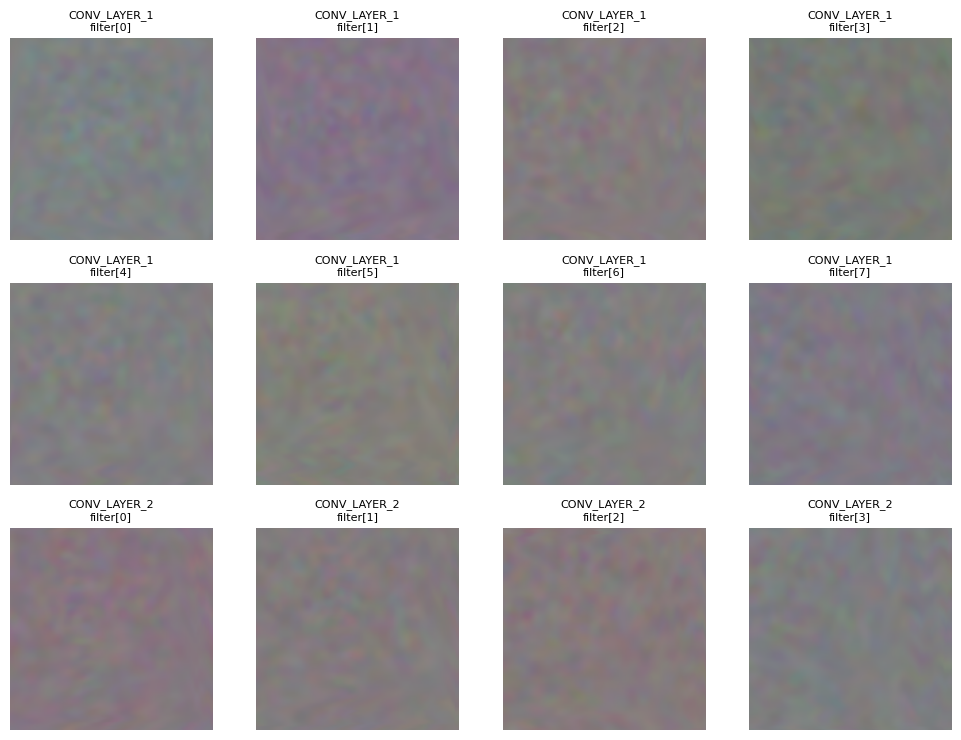


Activation maximization visualization complete for selected filters.


In [ ]:
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer, ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.activation_maximization import ActivationMaximization
from tf_keras_vis.activation_maximization.callbacks import Progress

# Define the layers and number of filters to visualize
layers_to_visualize = {
    'CONV_LAYER_1': 8,  # conv2d_2 has 8 filters
    'CONV_LAYER_2': 4   # conv2d_3 has 4 filters
}

# Determine the total number of subplots needed
total_filters = sum(layers_to_visualize.values())
n_cols = 4 # Number of columns in the plot grid
n_rows = (total_filters + n_cols - 1) // n_cols # Calculate number of rows needed

plt.figure(figsize=(n_cols * 2.5, n_rows * 2.5)) # Adjust figure size

plot_index = 1

# Iterate through layers and filters
for layer_name, num_filters in layers_to_visualize.items():
    print(f"Generating activations for layer: {layer_name}")

    # This instance constructs a new model whose output is replaced to the target layer's output.
    extract_intermediate_layer = ExtractIntermediateLayer(index_or_name=layer_name)

    # This instance modifies the model's last activation function to linear one.
    replace2linear = ReplaceToLinear()

    # Create an ActivationMaximization instance for the current layer
    activation_maximization = ActivationMaximization(model,
                                                   model_modifier=[extract_intermediate_layer, replace2linear],
                                                   clone=True)

    # Iterate through filters in the current layer
    for filter_number in range(num_filters):
        print(f"  Generating activation for filter: {filter_number}")
        # The score function for Activation Maximization on an intermediate layer filter is the filter index.
        score = CategoricalScore(filter_number)

        # Generate maximized activation for the current filter
        # Using fewer steps for potentially faster visualization across many filters
        activations = activation_maximization(score,
                                              callbacks=[]) # Removed progress bar for cleaner output during loop


        # Render the maximized activation image
        ax = plt.subplot(n_rows, n_cols, plot_index)

        # The output 'activations' is a list of images, take the first (and only) element.
        activation_image = activations[0]

        # Ensure the shape is suitable for displaying (H, W, C) or (H, W)
        # Clamp values to 0-255 range before casting to uint8
        activation_image = np.clip(activation_image, 0, 255)
        activation_image = tf.cast(activation_image, np.uint8)


        ax.imshow(activation_image)
        ax.set_title(f'{layer_name}\nfilter[{filter_number}]', fontsize=8)
        ax.axis('off')

        plot_index += 1

plt.tight_layout()
plt.show()

print("\nActivation maximization visualization complete for selected filters.")

Generating LIME explanation for image index 0...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 1...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 2...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 3...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 4...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 5...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 6...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 7...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 8...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 9...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 10...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 11...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 12...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 13...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 14...


  0%|          | 0/5000 [00:00<?, ?it/s]

Generating LIME explanation for image index 15...


  0%|          | 0/5000 [00:00<?, ?it/s]

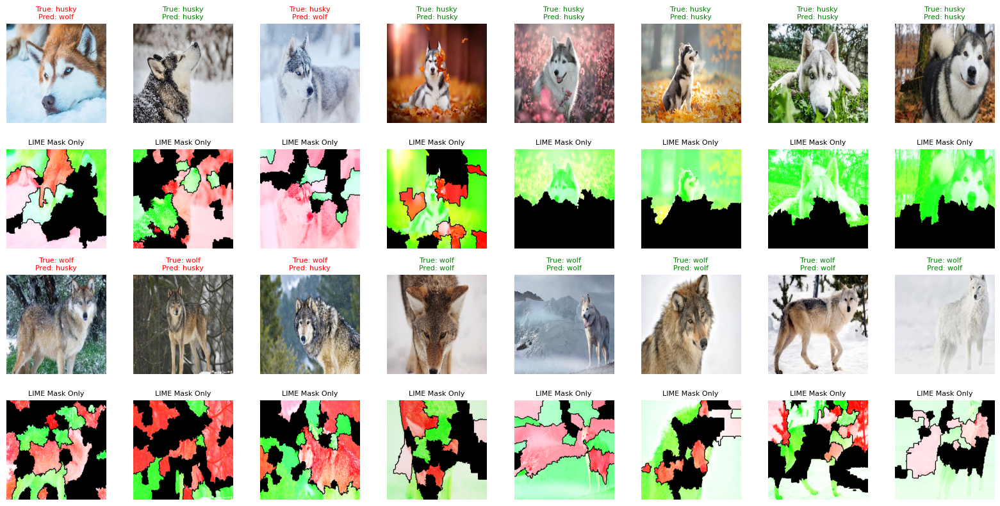


LIME explanation visualization complete for all validation images.


In [ ]:
import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
import numpy as np

# creating the explainer object
explainer = lime_image.LimeImageExplainer()

# Get predictions for all images to determine correct/incorrect classifications
predictions = model.predict(images)

# Render LIME explanations for all husky and wolf validation images
# Adjusted figure size for 4 rows x 8 columns (Original and Mask Only for each class)
plt.figure(figsize=(16, 8)) # Adjusted figure height

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Function to generate and plot LIME explanation for a single image
def plot_lime_explanation(image_index, subplot_row_original, subplot_row_mask_only):
    print(f"Generating LIME explanation for image index {image_index}...")
    # LIME expects images in the [0, 255] range and uint8 dtype
    image_for_lime = (images[image_index] * 255).astype(np.uint8)

    # Generate LIME explanation
    num_samples = 5000

    explanation = explainer.explain_instance(image_for_lime,
                                             model.predict,
                                             top_labels=2, # Explain the top 2 predicted classes to ensure the true label is considered
                                             hide_color=0,
                                             num_samples=num_samples)

    # Use the TRUE class index from the labels instead of the predicted one
    true_class_index = labels[image_index]

    # Get image and mask for visualization (Mask Only)
    # Modified get_image_and_mask parameters to show more features and both positive/negative
    temp_mask_only, mask_mask_only = explanation.get_image_and_mask(
        true_class_index,
        positive_only=False,  # Show both positive and negative features
        num_features=30,      # Increase number of features shown
        hide_rest=True)       # Hide the rest

    # Add after getting the mask
    if np.sum(mask_mask_only) == 0:
        print(f"Warning: Empty mask for image {image_index} (true class: {class_names[true_class_index]})")
        # Get the top predicted class and see its explanation instead
        pred_class = np.argmax(predictions[image_index])
        print(f"Showing explanation for predicted class ({class_names[pred_class]}) instead")
        temp_mask_only, mask_mask_only = explanation.get_image_and_mask(
            pred_class,
            positive_only=False,
            num_features=30,
            hide_rest=True)


    # Plot Original Image with Title
    ax1 = plt.subplot(4, 8, subplot_row_original) # 4 rows total
    ax1.imshow((images[image_index]*255).astype('uint8')) # Display original normalized image
    true_label = class_names[labels[image_index]]
    predicted_label = class_names[np.argmax(predictions[image_index])]
    ax1.set_title(f"True: {true_label}\nPred: {predicted_label}", fontsize=8, color='green' if np.argmax(predictions[image_index]) == labels[image_index] else 'red')
    ax1.axis('off')

    # Plot LIME Mask Only
    ax3 = plt.subplot(4, 8, subplot_row_mask_only) # 4 rows total
    # mark_boundaries returns float, cast to uint8 to avoid warning.
    ax3.imshow(mark_boundaries(temp_mask_only, mask_mask_only).astype(np.uint8))
    ax3.set_title(f"LIME Mask Only", fontsize=8)
    ax3.axis('off')


# Plot Huskies (Original in row 1, Mask Only in row 2)
for i, img_index in enumerate(husky_indices):
    plot_lime_explanation(img_index, i + 1, i + 9) # Row indices 1, 2

# Plot Wolves (Original in row 3, Mask Only in row 4)
for i, img_index in enumerate(wolf_indices):
    plot_lime_explanation(img_index, i + 17, i + 25) # Row indices 3, 4 (start indices: 2*8+1, 3*8+1)

plt.tight_layout()
plt.show()

print("\nLIME explanation visualization complete for all validation images.")

## Analysis and conclusion

### Model  and analysis details

Training dataset size: 76 images

Validation dataset size: 16 images

Accuracy on validation set: 68.8% (11 of 16 images correct)

XAI methods used (for all validation images and filters):
 * Saliency maps (with and without smoothing):
 * GradCam, GradCam++
 * Network dissection/filter analysis
 * SHAP: Areas that positively contributed to predicting the true class will be green. Areas with negative contribution will be red.

### Analysis of what the model seem to have learned

As the model has poor performance (68% accuracy) we can expect that there are significant shortcomings in what that model has learned. There are signs that the model perhaps has learned to identify some valuable features, but also some signs that are more troubling.

The plotting of the convolutional filters didn't give me any insights to what has been learned. Better training, data and architecture could improve this.


**Face/head features:** It seems the model have paid some attention to the ear shape, especially in the images that were correctly classified as wolves.

**Background and vegetation features:** It seems like the model interprets images with backgrounds that are colorful and/or have patterns (grass, leaves, branches) to be a husky (see huskies 4,5,6,7,8 and wolves 1, 2, 3 in the standard GradCAM and the LIME analysis).

### Conclusions
The model seems to be paying more attention to background/environment than features of the animals when making predictions. Limitations in the dataset, the training process (e.g. not using validation data to steer the training) and model architecture are likely causes for this. This is a example of "shortcut learning" and the model will not be good at predicting class for images in which the background in not similar to the images in the training data set of same class.

The current model now makes it prediction based on where the specific animal were typically photographed. Had there been more difference in appearance between huskies and wovles then the likelihood of the model focusing more on the animals instead of the background would be higher I believe.